# General information

This is the problem description for the final project of the course *"Data Science for Dynamical Systems"* (Winter Term 2024/25)

Below, you will find three tasks, accompanied by three datasets. 

**IMPORTANT: out of these, you should only select two tasks as your final project**

In [4]:
# Uncomment if packages are missing
using Pkg
Pkg.add("LaTeXStrings")
Pkg.add("Printf")
Pkg.add("JLD2")
Pkg.add("CairoMakie")
Pkg.add("OrdinaryDiffEq")
Pkg.add("Lux")
Pkg.add("Random")
Pkg.add("ComponentArrays")

using LaTeXStrings
using Printf
using JLD2
using OrdinaryDiffEq, Lux, Random, ComponentArrays

using CairoMakie
dark_latexfonts = merge(theme_black(), theme_latexfonts())
set_theme!(dark_latexfonts)

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.10/Project.toml`
  No Changes to `~/.julia/environments/v1.10/Manifest.toml`
   Resolving package versions...
   Installed WeightInitializers ─ v1.1.1
   Installed Functors ─────────── v0.5.2
   Installed MLDataDevices ────── v1.6.8
   Installed LuxLib ───────────── v1.5.0
   Installed LuxCore ──────────── v1.2.2
  

# Task 1: Unknown Ordinary Differential Equation (ODE)

This dataset contains 
* $m=200$ trajectories,
* with $N=201$ time steps each,
* with time step $dt=0.01$ (i.e., the trajectories have length $(t_0,t_e)=(0,2)$).

The data has been 
* collected from an unknown ODE with state dimension $n=2$,
* corrupted with zero-mean Gaussian noise,
* stored in a 3D array $X\in\mathbb{R}^{n \times N \times m}$, meaning that the individual trajectories can be accessed using the command "X[:, :, i]".

**Task:**
* **Train a model using the dataset $X$ that predicts the system behavior as accurately as possible over $N_p=100$ time steps, for arbitrary initial conditions $x_0\in[-2,2]^2$.** 
* The error should be measured as the MSE between the predicted state and the ground truh (i.e., the given data).
* You may either train a black-box model or identify the governing equations from data.
* *Note:* Given the fact that the trajectories are longer than the desired prediction horizon, it is also allowed to use the first half for initialization, for instance when using recurrent neural network architectures such as *Reservoir Computers* or *LSTMs*.

### Load and visualize dataset

In [2]:
# Load
fileODE = jldopen("ODE.jld2");
X = fileODE["X"];
time = fileODE["time"];

# dimensions
n = size(X, 1);
N = size(X, 2);
m = size(X, 3);

fileODE = nothing;

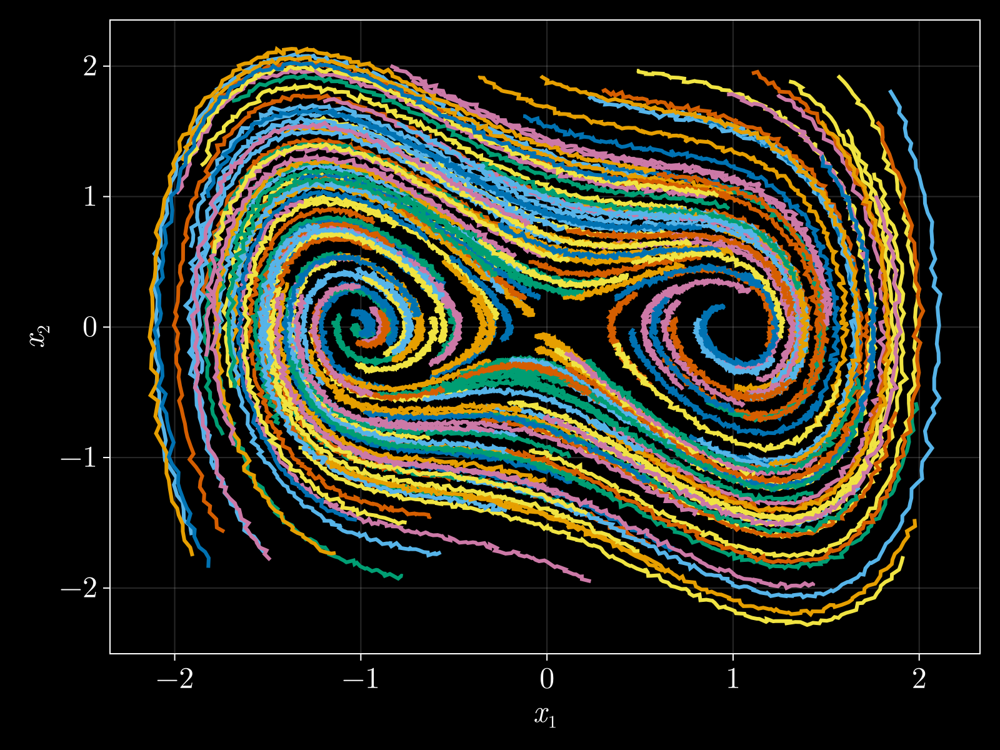

In [3]:
# Plot dataset
fig = Figure(fontsize = 24, size=(800,600))
ax1 = Axis(fig[1, 1], xlabel = L"x_1", ylabel = L"x_2")
for i in 1 : m
    lines!(ax1, X[1, :, i], X[2, :, i], linewidth=3)
end
fig

# Task 2: The 1D Kuramoto-Sivashinsky equation

This task concerns the 1D Kuramoto-Sivashinsky equation (Wikipedia: https://en.wikipedia.org/wiki/Kuramoto%E2%80%93Sivashinsky_equation) in the following form:

$$ \frac{\partial x}{\partial t} = -4\frac{\partial^4 x}{\partial s^4} - \mu \left( \frac{\partial^2 x}{\partial s^2} + x \frac{\partial x}{\partial s} \right), $$

where 

* $x(s,t)\in\mathbb{R}$ is the one-dimensional system state, 
* $\mu\in\{ 1,2,3, \ldots, 99, 100 \}$ is an unknown parameter, and 
* $t\geq0$ and $s\in\Omega = (0,2\pi)$ are the time and space variables, respectively. 

We consider periodic boundary conditions, i.e.,

$$ x(0, t) = x(2\pi, t) \qquad \text{for all}\quad t.$$ 

The dataset 
* consists of $m=2$ trajectories, corresponding to two different values for $\mu$
* with $N=401$ time steps each,
* a time step of $dt=0.1$ (note that the time step for the simulation has to be much smaller for stability reasons),
* and a spatial dimension of $n=50$ that has been obtained by discretizing $\Omega$ using finite differences. <br>
(**Note:** the final point $x(2\pi, t)$ (which would be $x_{n+1}$) is not part of the dataset, as it is identical to $x_1$ due to periodicity; the samples are placed between $s=0$ and $s=L - \frac{L}{n}$, see also the range of $s$ below.)

The data is stored in the two matrices $X_1, X_2\in\mathbb{R}^{n \times N}$.

**Task:**
* **Train a parameter-dependent model that depends on $\mu$ using the datasets $X_1$ and $X_2$. Prediction accuracy should be measured over $N_p=100$ time steps, with initial condition $x_0$ drawn uniformly from the first 301 time steps of the dataset.** 
* The error should be measured as the MSE between the predicted state and the ground truh (i.e., the given data).
* You may either train a black-box model or use a physics-informed neural network (PINN).
* If you cannot realize the parameter dependency for a single model, you may alternatively train two separate models.
* *Note:* Given the fact that the trajectories are longer than the desired prediction horizon, it is also allowed to use some of the data initialization, for instance when using recurrent neural network architectures such as *Reservoir Computers* or *LSTMs*.

### Load and visualize dataset

In [4]:
# Load
fileKS = jldopen("KS.jld2")
X1_KS = fileKS["X1"]
X2_KS = fileKS["X2"]
time_KS = fileKS["time"]

# dimensions
n_KS = size(X1_KS, 1);
N_KS = size(X1_KS, 2);

# space-time variables for plotting
L_KS = 2 * pi                           # domain size
ds_KS = L_KS / n_KS                     # grid size
s_KS = LinRange(0, L_KS - ds_KS, n_KS); # array of coordinates for the state x
S_KS = repeat(s_KS, 1, N_KS);           # repeated space array for plotting
T_KS = repeat(time_KS', n_KS, 1);       # repeated time array for plotting

fileKS = nothing;

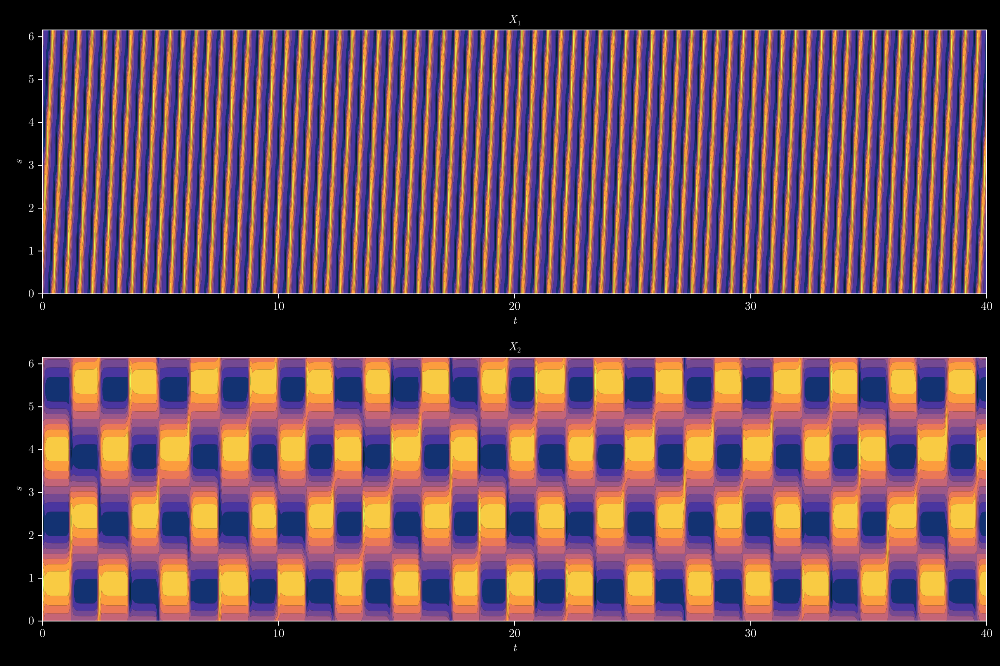

In [5]:
# plot
fig = Figure(size = (1200, 800), backgroundcolor = "black")
ax1 = Axis(fig[1, 1], backgroundcolor = "black", xlabel=L"t", ylabel=L"s", title=L"X_1")
contourf!(ax1, vec(T_KS), vec(S_KS), vec(X1_KS), colormap=:thermal)

ax2 = Axis(fig[2, 1], backgroundcolor = "black", xlabel=L"t", ylabel=L"s", title=L"X_2")
contourf!(ax2, vec(T_KS), vec(S_KS), vec(X2_KS), colormap=:thermal)
fig

# Task 3: The 2D Cahn-Hillard equation

This task concerns the 2D Cahn-Hillard equation (Wikipedia: https://en.wikipedia.org/wiki/Cahn%E2%80%93Hilliard_equation) in the following form:

$$ \frac{\partial x}{\partial t} = D \Delta \left( x^3 - x - \gamma \Delta x \right), $$

where 

* $\Delta$ denotes the Laplace operator: $$\Delta x = \sum_{i=1}^n \frac{\partial^2 x}{\partial s_i^2} = \frac{\partial^2 x}{\partial s_1^2} + \frac{\partial^2 x}{\partial s_2^2} \qquad\text{(where the last one is the special case }n=2\text{ )}$$
* $x(s,t)\in[-1,1]$ is the one-dimensional system state, 
* $D=3$ and $\gamma=0.5$ are known parameters, and 
* $t\geq 0$ and $s\in\Omega = (0,L)^2$ (with $L=100$) are the time and 2D spatial variables, respectively. 

We consider periodic boundary conditions, i.e.,

$$ x\left( \begin{pmatrix} 0 \\ s_2 \end{pmatrix}, t\right) = x\left( \begin{pmatrix} L \\ s_2 \end{pmatrix}, t\right)  \quad \text{for all}\quad s_2\in(0,L) \qquad \text{and}\qquad x\left( \begin{pmatrix} s_1 \\ 0 \end{pmatrix}, t\right) = x\left( \begin{pmatrix} s_1\\ L \end{pmatrix}, t\right)  \quad \text{for all}\quad s_1\in(0,L).$$ 

The dataset 
* consists of $m=3$ trajectories, corresponding to three different initial conditions,
* with $N=401$ time steps each,
* a time step of $dt=0.1$ (note that the time step for the simulation has to be much smaller for stability reasons),
* and a spatial dimension of $n=100 \times 100 = 10,000$ that has been obtained by discretizing $\Omega$ using finite differences. <br> 
(**Note:** the final points $x\left(\begin{pmatrix} s_1 \\ L \end{pmatrix}, t\right)$, $x\left(\begin{pmatrix} L \\ s_2 \end{pmatrix}, t\right)$ (which would be identical to $x\left(\begin{pmatrix} s_1 \\ 0 \end{pmatrix}, t\right)$, $x\left(\begin{pmatrix} 0 \\ s_2 \end{pmatrix}, t\right)$ due to periodicity) are not part of the datases; see also the range of $S1$ and $S2$ below.)

The data is stored in the three matrices $X_1, X_2, X_3\in\mathbb{R}^{n \times N}$. The corresponding spatial coordinates are stored in vectors $S_1, S_2 \in\mathbb{R}^n$. If you want to transform individual snapshots back to their 2D shapes, you can use the command "reshape(X_1[:, i], (n, n))", see also an exemplary code snippet below.

**Task:**
* **Train a model that accurately predicts the system state over $N_p=100$ time steps, with initial condition $x_0$ drawn uniformly from the first 301 time steps of the dataset.** 
* The error should be measured as the MSE between the predicted state and the ground truh (i.e., the given data).
* You may either train a black-box model or use a physics-informed neural network (PINN).
* If you consider using a PINN, then training individual models for the individual trajectories will be necessary, which is ok.
* Given the fact that the trajectories are longer than the desired prediction horizon, it is also allowed to use some of the data for initialization, for instance when using recurrent neural network architectures such as *Reservoir Computers* or *LSTMs*.

### Load and visualize dataset

In [7]:
# Load 
fileCH = jldopen("data/CH_D3.jld2")
X1_CH = fileCH["X1"]
X2_CH = fileCH["X2"]
X3_CH = fileCH["X3"]
time_CH = fileCH["time"]

# dimensions
n_CH = 100;
N_CH = size(X1_CH, 2);

# space-time variables for plotting
dt_CH = time_CH[2] - time_CH[1]         # time step
L_CH = 100                              # domain length
ds_CH = L_CH / n_CH                     # grid size
s_CH = LinRange(0, L_CH-ds_CH, n_CH);   # spatial grid in 1D
S1_CH = vec(repeat(s_CH, 1, n_CH));     # construction of n x n array (and then vectorization) for the cooridnate s1
S2_CH = vec(repeat(s_CH', n_CH, 1));    # construction of n x n array (and then vectorization) for the cooridnate s2

# Note: for transforming individual snapshots to a 2D array form, you may use the following commands
# S1_2D_CH = reshape(S1_CH, (n_CH, n_CH))
# S2_2D_CH = reshape(S2_CH, (n_CH, n_CH))
# X1_1_2D_CH = reshape(X1_CH[:, 1], (n_CH, n_CH))

fileCH = nothing;

In [14]:
X1_CH[2,:]

401-element Vector{Float64}:
 -0.4866868167501115
 -0.4872115093386584
 -0.4877041877407457
 -0.4881619912840833
 -0.4885822265952883
 -0.48896241206693514
 -0.4893003274253315
 -0.4895940547136582
 -0.48984199943763296
 -0.49004288563847886
  ⋮
  0.9881333567916816
  0.988359143783029
  0.9885781049368749
  0.9887905400868631
  0.9889967616842733
  0.9891970912554588
  0.9893918558771786
  0.9895813847251406
  0.9897660057498948

In [21]:
Lux.Chain(
    Lux.Dense(10000 => 16384, tanh),
    Lux.Dense( => 10000, tanh),
    Lux.Dense( => 10000, tanh),
    Lux.Dense( => 10000, tanh),
    Lux.Dense( => 10000, tanh),
    Lux.Dense( => 10000, tanh),
    Lux.Dense( => 10000, tanh),
    Lux.Dense( => 10000, tanh)
)

10000-element Vector{Float64}:
 -0.833865346719906
 -0.4866868167501115
  0.5996960067160954
  0.9223321494368549
  0.9797499572888478
  0.9719742556814116
  0.8754625999594614
  0.4128168476168843
 -0.6024832047893546
 -0.8730513245372129
  ⋮
 -0.9128442103569249
 -0.8418913303061246
 -0.3671143002813501
  0.6629613185599544
  0.9333359308898911
  0.9556505214700436
  0.800217146048781
  0.07819498136818324
 -0.7241000005420909

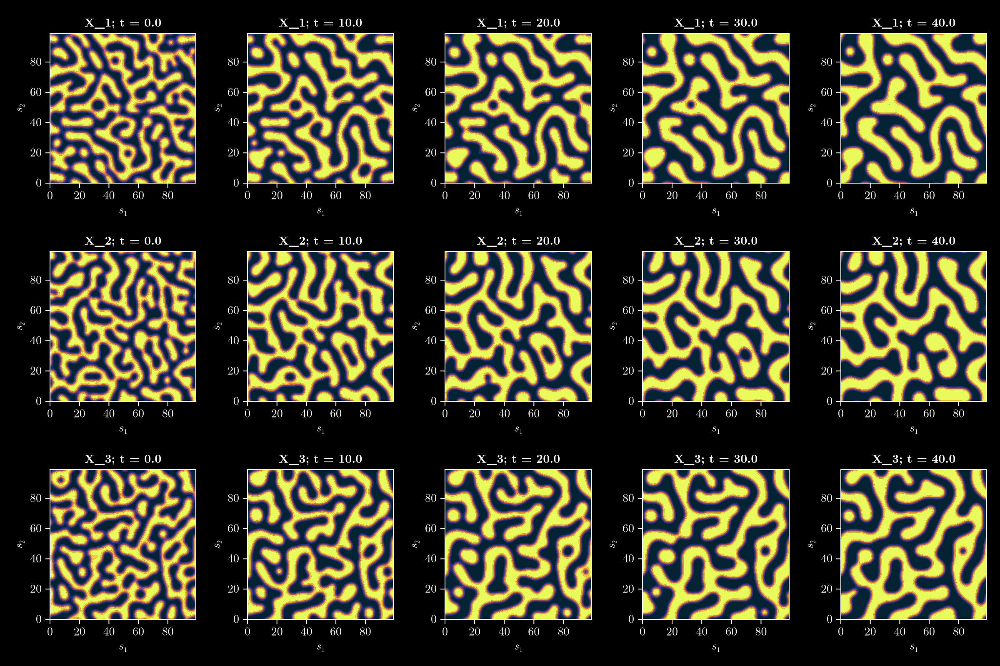

In [7]:
# Plot

# plot 2D array
function add_ax2(x, S1, S2, i, j, titlestr)
    ax = Axis(fig[i, j], title=titlestr, xlabel=L"s_1", ylabel=L"s_2")
    contourf!(ax, S2, S1, x, colormap=:thermal)
end;

# Plot every 100th snapshot per run
iPlot = [1,101,201,301,401]

fig = Figure(size = (1200, 800))
for i in 1 : length(iPlot)
    add_ax2(X1_CH[:, iPlot[i]], S1_CH, S2_CH, 1, i, @sprintf("X_1; t = %.1f", (iPlot[i]-1) * dt_CH))
end
for i in 1 : length(iPlot)
    add_ax2(X2_CH[:, iPlot[i]], S1_CH, S2_CH, 2, i, @sprintf("X_2; t = %.1f", (iPlot[i]-1) * dt_CH))
end
for i in 1 : length(iPlot)
    add_ax2(X3_CH[:, iPlot[i]], S1_CH, S2_CH, 3, i, @sprintf("X_3; t = %.1f", (iPlot[i]-1) * dt_CH))
end
fig